<a href="https://colab.research.google.com/github/MiPat03/PlantDiseaseDetection/blob/main/PlantDiseaseDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import torchvision
import torch.nn.functional as F
from torchvision import datasets, transforms, models
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 32
dataset_path = './PlantVillage-20240329T093356Z-001/PlantVillage'

In [ ]:
transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(20),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [ ]:
dataset = datasets.ImageFolder(root=dataset_path, transform=transform)
class_names = dataset.classes

train_size = int(0.8 * len(dataset))
val_size = int(0.1 * len(dataset))
test_size = len(dataset) - (train_size + val_size)

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, val_size, test_size])

train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(dataset=val_dataset, batch_size=BATCH_SIZE, shuffle=True)

In [ ]:
class_names

['Tomato_Bacterial_spot',
 'Tomato_Early_blight',
 'Tomato_Late_blight',
 'Tomato_Leaf_Mold',
 'Tomato_Septoria_leaf_spot',
 'Tomato_Spider_mites_Two_spotted_spider_mite',
 'Tomato__Target_Spot',
 'Tomato__Tomato_YellowLeaf__Curl_Virus',
 'Tomato__Tomato_mosaic_virus',
 'Tomato_healthy']

In [ ]:
for images, labels in train_loader:
    # Your code here
    print(images.shape)
    print(labels.numpy())

torch.Size([32, 3, 256, 256])
[4 4 9 2 6 3 6 0 3 0 7 4 4 6 7 4 5 9 1 1 3 7 5 3 5 6 3 0 0 7 5 7]
torch.Size([32, 3, 256, 256])
[7 4 7 2 1 0 1 0 7 6 2 3 0 5 2 0 5 2 0 7 7 9 4 7 6 2 4 1 7 2 7 6]
torch.Size([32, 3, 256, 256])
[2 7 9 4 9 2 7 5 5 5 4 4 7 4 7 2 5 4 6 3 7 7 0 7 3 3 3 5 7 9 7 2]
torch.Size([32, 3, 256, 256])
[5 7 1 0 0 9 7 4 1 6 3 9 7 5 2 1 7 7 0 7 5 0 6 1 7 5 7 9 7 7 7 5]
torch.Size([32, 3, 256, 256])
[2 4 6 7 0 7 2 9 7 0 5 7 2 8 9 8 9 0 7 2 7 7 9 9 5 5 5 3 0 5 9 4]
torch.Size([32, 3, 256, 256])
[7 0 9 5 7 5 2 9 9 7 1 7 6 7 8 1 5 6 6 9 7 0 2 7 1 9 0 6 7 7 0 4]
torch.Size([32, 3, 256, 256])
[1 7 5 9 5 6 0 0 4 7 4 5 5 4 4 5 4 4 0 4 7 6 5 8 2 2 2 2 9 0 6 6]
torch.Size([32, 3, 256, 256])
[2 7 5 0 5 5 5 4 6 2 0 1 7 7 7 9 8 7 5 7 2 5 0 5 9 5 0 8 2 0 5 0]
torch.Size([32, 3, 256, 256])
[5 2 7 0 0 5 5 0 9 7 0 0 7 4 5 7 2 0 1 0 2 5 7 7 5 7 2 5 7 7 2 0]
torch.Size([32, 3, 256, 256])
[1 6 9 7 2 2 4 9 4 9 6 1 5 2 5 6 6 7 2 6 0 4 7 0 2 6 2 2 5 0 4 3]
torch.Size([32, 3, 256, 256])
[8 7 1 4 4

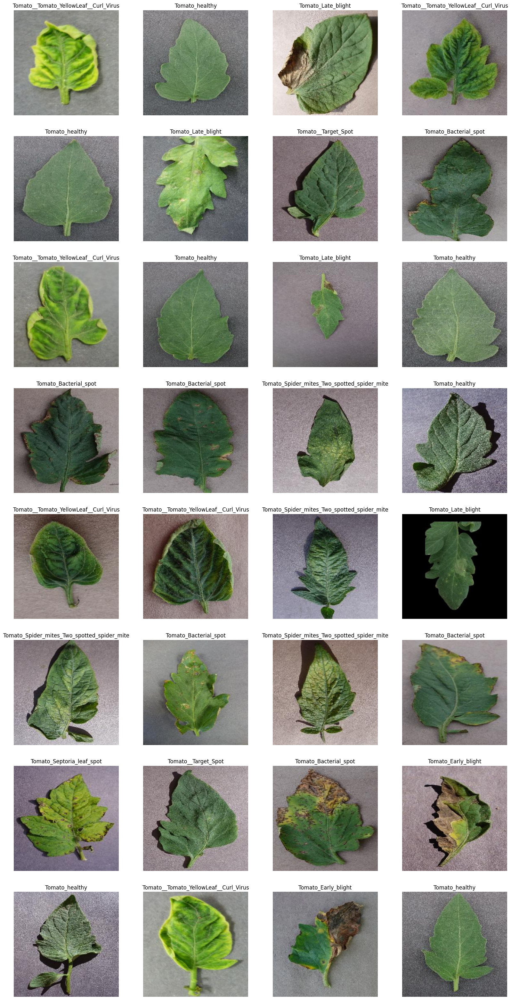

In [ ]:
import math
transform2 = transforms.Compose([
    transforms.ToTensor(),
])

dataset1 = datasets.ImageFolder(root=dataset_path, transform = transform2)
train_size1 = int(0.8 * len(dataset))
val_size1 = int(0.1 * len(dataset))
test_size1 = len(dataset) - (train_size + val_size)

train_dataset1, val_dataset1, test_dataset1 = torch.utils.data.random_split(dataset1, [train_size1, val_size1, test_size1])

train_loader1 = DataLoader(dataset=train_dataset1, batch_size=BATCH_SIZE, shuffle=True)
test_loader1 = DataLoader(dataset=test_dataset1, batch_size=BATCH_SIZE, shuffle=True)
val_loader1 = DataLoader(dataset=val_dataset1, batch_size=BATCH_SIZE, shuffle=True)

for images_batch, labels_batch in train_loader1:
    num_images = len(images_batch)
    num_cols = 4
    num_rows = math.ceil(num_images / num_cols)

    plt.figure(figsize=(20, 5 * num_rows))
    for i in range(num_images):
        ax = plt.subplot(num_rows, num_cols, i + 1)
        image_np = np.transpose(images_batch[i].numpy(), (1, 2, 0))
        plt.imshow(image_np)
        class_name = class_names[labels_batch[i]]
        plt.title(class_name)
        plt.axis('off')
    plt.show()
    break

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


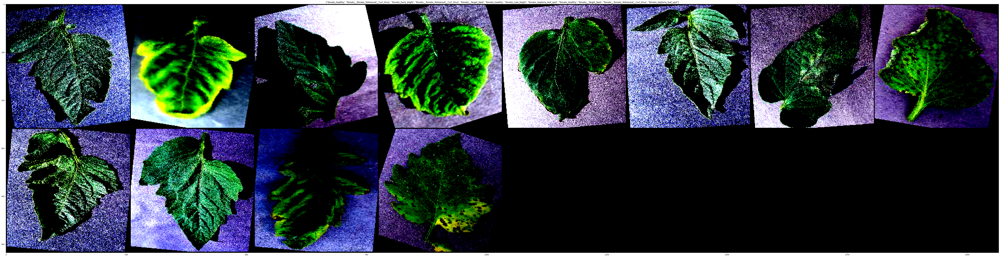

In [ ]:
def imshow(inp, title=None):
    inp = inp.numpy().transpose((1, 2, 0))
    plt.figure(figsize=(100, 100))
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

inputs, classes = next(iter(train_loader))
out = torchvision.utils.make_grid(inputs[:12])
imshow(out, title=[class_names[x] for x in classes[:12]])

In [ ]:
class PlantDiseaseModel(nn.Module):
    def __init__(self, num_classes=3, init_image_size=256):
        super(PlantDiseaseModel, self).__init__()
        self.init_image_size = init_image_size
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        feature_size = self.init_image_size // (2 ** 6)
        linear_input_features = 64 * (feature_size ** 2)

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(linear_input_features, 64),
            nn.ReLU(inplace=True),
            nn.Linear(64, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


In [ ]:
device = torch.device("cuda")
model = PlantDiseaseModel(num_classes = 10).to(device)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
model

PlantDiseaseModel(
  (features): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU(inplace=True)
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (12): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (15): Conv2d

In [ ]:
device

device(type='cuda')

In [ ]:
num_epochs = 50

train_losses = []
val_losses = []
train_accuracies = []
val_accuracies = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_losses.append(running_loss / len(train_loader))
    train_accuracies.append(100 * correct / total)

    # Validation loop
    model.eval()
    val_running_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_losses.append(val_running_loss / len(val_loader))
    val_accuracies.append(100 * val_correct / val_total)

    print(f'Epoch {epoch+1}, Loss: {running_loss / len(train_loader)}, '
          f'Validation Loss: {val_running_loss / len(val_loader)}, '
          f'Accuracy: {100 * correct / total}%')

Epoch 1, Loss: 1.3328254967556332, Validation Loss: 0.9042575873580634, Accuracy: 51.62094763092269%
Epoch 2, Loss: 0.7713114583581463, Validation Loss: 0.6924121911619224, Accuracy: 72.9426433915212%
Epoch 3, Loss: 0.592989082311157, Validation Loss: 0.4863322023667541, Accuracy: 79.65243142144638%
Epoch 4, Loss: 0.4566919437964955, Validation Loss: 0.3665671748857872, Accuracy: 84.34382793017457%
Epoch 5, Loss: 0.354770802574562, Validation Loss: 0.3259545431709757, Accuracy: 87.85847880299252%
Epoch 6, Loss: 0.2852698376128204, Validation Loss: 0.31513386731054266, Accuracy: 90.15741895261846%
Epoch 7, Loss: 0.2702704929326315, Validation Loss: 0.2426170951998667, Accuracy: 90.31327930174564%
Epoch 8, Loss: 0.2281171815734626, Validation Loss: 0.294094000376907, Accuracy: 92.33167082294264%
Epoch 9, Loss: 0.20828691693928622, Validation Loss: 0.2558468016339283, Accuracy: 92.88497506234414%
Epoch 10, Loss: 0.1772875372991616, Validation Loss: 0.34324512903706406, Accuracy: 93.804551

In [ ]:
# Test Phase
model.eval()
test_loss = 0.0
correct = 0
total = 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        loss = criterion(outputs, labels)
        test_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

test_loss /= len(test_loader)
accuracy = 100 * correct / total
print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {accuracy:.2f}%')

Test Loss: 0.0774, Test Accuracy: 97.69%


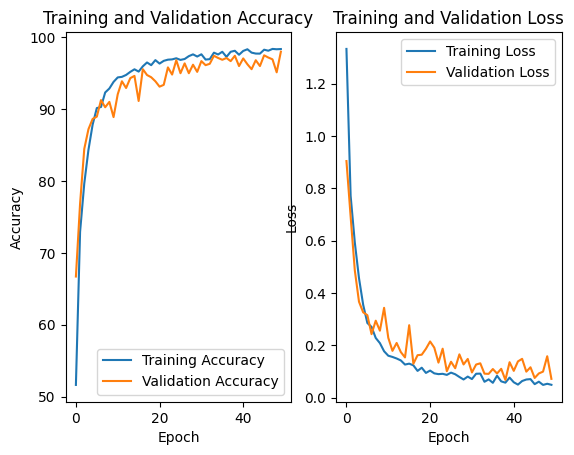

In [ ]:
plt.subplot(1, 2, 1)
plt.plot(train_accuracies, label='Training Accuracy')
plt.plot(val_accuracies, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(train_losses, label='Training Loss')
plt.plot(val_losses, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [ ]:
import numpy as np
import torch

def predict(model, img):
    img = img.unsqueeze(0).to(device)

    with torch.no_grad():
        outputs = model(img)

    outputs_np = outputs.cpu().numpy()
    predicted_class_index = np.argmax(outputs_np)
    predicted_class = class_names[predicted_class_index]
    confidence = round(100 * torch.nn.functional.softmax(outputs, dim=1).squeeze(0)[predicted_class_index].item(), 2)

    return predicted_class, confidence


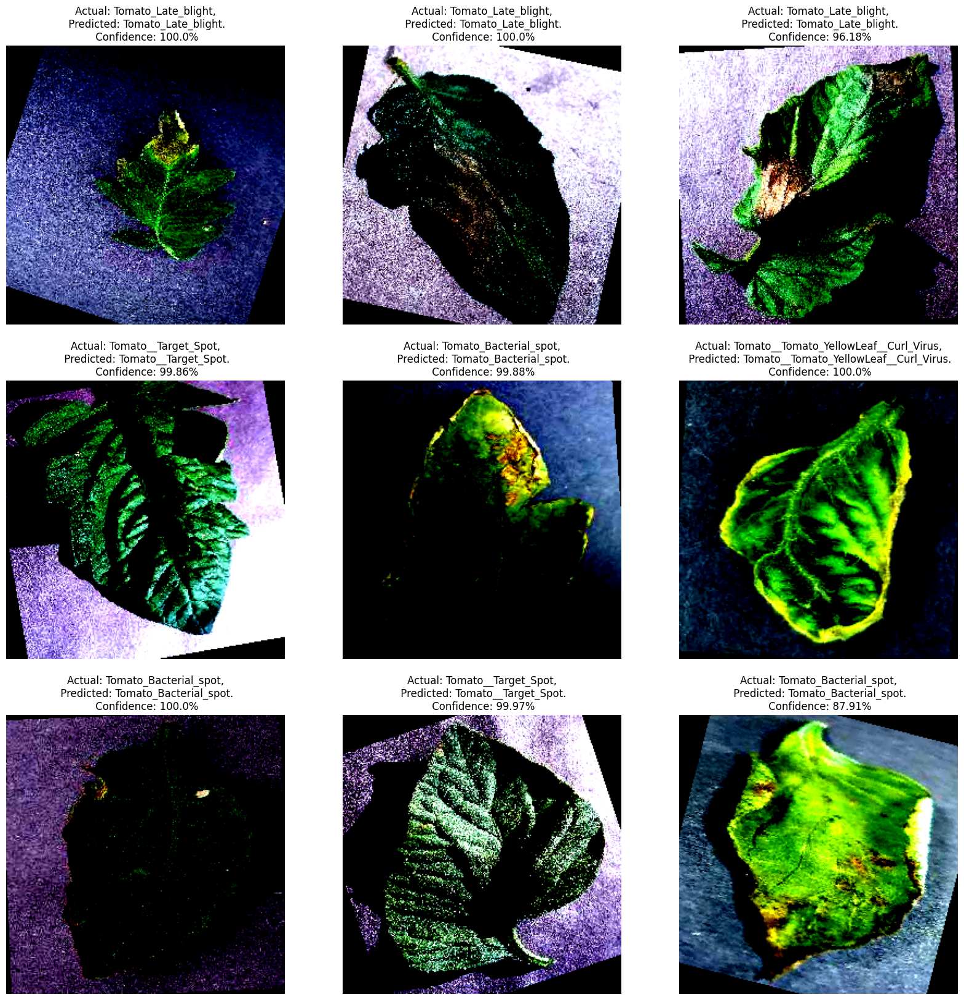

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 20))
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        for i in range(min(9, len(images))):  # Iterate up to the minimum of 9 or the number of images in the batch
            ax = plt.subplot(3, 3, i + 1)
            # Normalize the image tensor to be in the range [0, 1]
            image_np = images[i].cpu().numpy().transpose((1, 2, 0))
            plt.imshow(image_np.clip(0, 1))  # Clip pixel values to [0, 1]
            predicted_class, confidence = predict(model, images[i])

            actual_class = class_names[labels[i].item()]
            plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
            plt.axis("off")

plt.savefig('plot_final.jpg')
plt.show()


In [ ]:
model.eval()
with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)


In [ ]:
def predict_pytorch(model, img, class_names, transform):
    img_transformed = transform(img).unsqueeze(0)

    device = next(model.parameters()).device
    img_transformed = img_transformed.to(device)

    model.eval()
    with torch.no_grad():
        outputs = model(img_transformed)
        probabilities = torch.nn.functional.softmax(outputs, dim=1)
        confidence, predicted = torch.max(probabilities, 1)
        predicted_class = class_names[predicted.item()]
        confidence = round(100 * confidence.item(), 2)

    return predicted_class, confidence



In [ ]:
import os

checkpoint_dir = 'C:/Users/admin/Desktop/College/6th Sem/DL proj'

os.makedirs(checkpoint_dir, exist_ok=True)

checkpoint_file = os.path.join(checkpoint_dir, 'model_checkpoint_final.pth')

torch.save({
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict(),
    'epoch_loss' : test_loss,
    'epoch_acc' : accuracy,
}, checkpoint_file)

print("Checkpoint created successfully at:", checkpoint_file)


Checkpoint created successfully at: C:/Users/admin/Desktop/College/6th Sem/DL proj\model_checkpoint_final.pth


In [ ]:
plt.savefig('plot2.jpg')

<Figure size 640x480 with 0 Axes>